In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/MyDrive/DL_Project/kaggle_pics/kaggle_api"

In [3]:
%cd /content/gdrive/MyDrive/DL_Project/kaggle_pics/kaggle_api

/content/gdrive/MyDrive/DL_Project/kaggle_pics/kaggle_api


In [4]:
!kaggle datasets download -d ashishjangra27/face-mask-12k-images-dataset

 98% 325M/330M [00:04<00:00, 57.1MB/s]
100% 330M/330M [00:04<00:00, 78.3MB/s]


In [5]:
!unzip \*.zip  && rm *.zip

Archive:  face-mask-12k-images-dataset.zip
replace Face Mask Dataset/Test/WithMask/1163.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [6]:
import numpy as np
import pandas as pd
import tensorflow as tf
import keras
from keras import layers
from keras.applications import VGG19
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import cv2

In [7]:
path = 'Face Mask Dataset/'

train_gen = ImageDataGenerator(rescale=1./255)
test_gen = ImageDataGenerator(rescale=1./255)
val_gen = ImageDataGenerator(rescale=1./255)

img_size = (128, 128)

train_ds = train_gen.flow_from_directory(path+'Train', target_size=img_size)
test_ds = test_gen.flow_from_directory(path+'Test', target_size=img_size)
val_ds = val_gen.flow_from_directory(path+'Validation', target_size=img_size)

Found 10000 images belonging to 2 classes.
Found 992 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


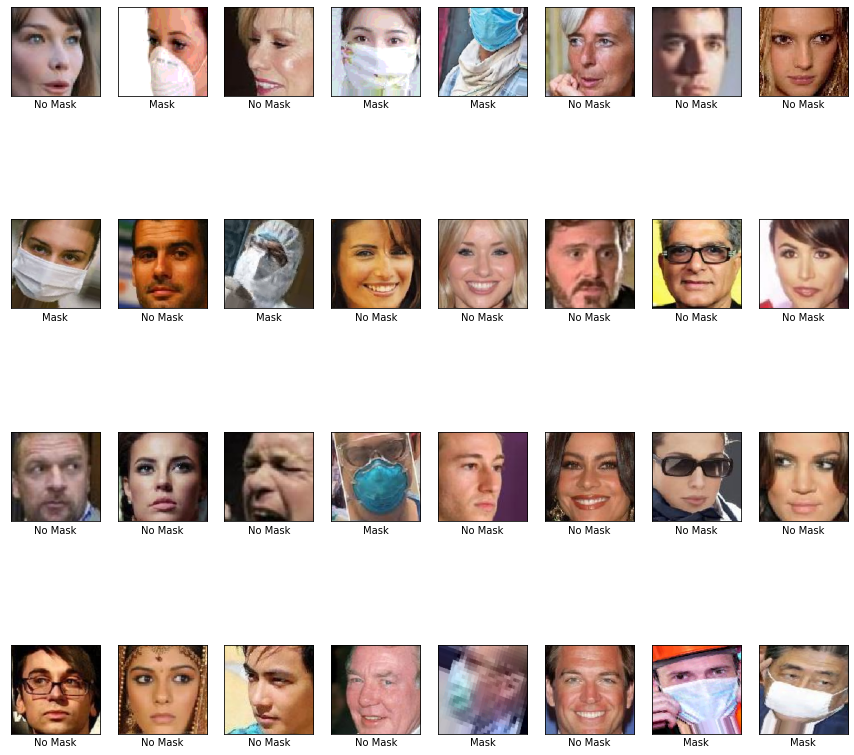

In [8]:
images, labels = next(iter(train_ds))
plt.figure(figsize=(15, 15))
for i in range(32):
    plt.subplot(4, 8, i+1)
    plt.imshow(images[i])
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('No Mask' if labels[i][1] == 1 else 'Mask')

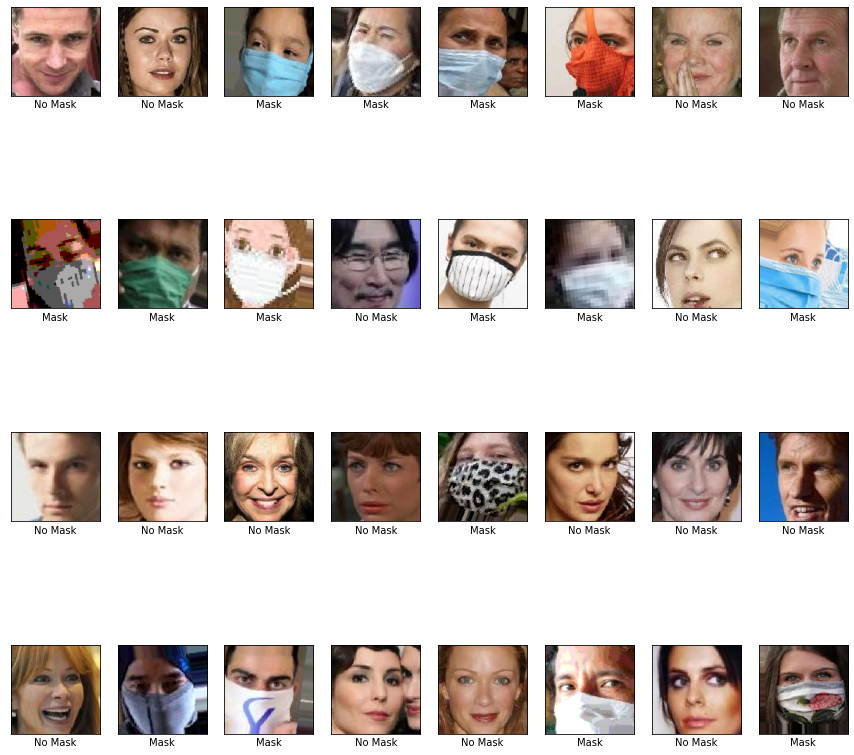

In [9]:
images, labels = next(iter(test_ds))
plt.figure(figsize=(15, 15))
for i in range(32):
    plt.subplot(4, 8, i+1)
    plt.imshow(images[i])
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('No Mask' if labels[i][1] == 1 else 'Mask')

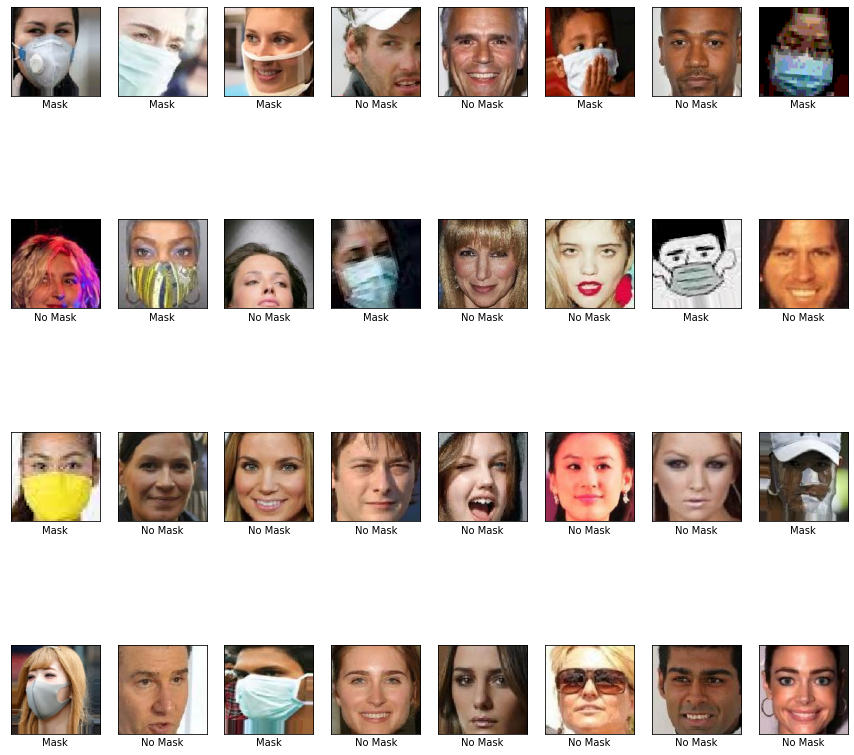

In [10]:
images, labels = next(iter(val_ds))
plt.figure(figsize=(15, 15))
for i in range(32):
    plt.subplot(4, 8, i+1)
    plt.imshow(images[i])
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('No Mask' if labels[i][1] == 1 else 'Mask')

**Manual AlexNet Implementation**

In [11]:
model = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(128,128,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(1,1), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(1,1), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(2, activation='sigmoid')])

In [12]:
model.compile(loss='categorical_crossentropy', optimizer=tf.optimizers.SGD(lr=0.01), metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 30, 30, 96)        34944     
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 96)        384       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 96)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 14, 256)       614656    
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 256)       1024      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 256)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 6, 6, 384)         8

In [13]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping,ReduceLROnPlateau

In [14]:
Estop = EarlyStopping(monitor = 'val_loss',patience = 5,verbose = 1,min_delta = 0.01)

In [15]:
model.fit(train_ds, epochs=20,  validation_data = val_ds,callbacks=[Estop])

Epoch 1/20
313/313 [==============================] - 26s 75ms/step - loss: 0.7414 - accuracy: 0.8330 - val_loss: 0.2402 - val_accuracy: 0.9050
Epoch 2/20
313/313 [==============================] - 23s 73ms/step - loss: 0.1084 - accuracy: 0.9605 - val_loss: 0.1184 - val_accuracy: 0.9500
Epoch 3/20
313/313 [==============================] - 23s 73ms/step - loss: 0.0521 - accuracy: 0.9804 - val_loss: 0.0283 - val_accuracy: 0.9912
Epoch 4/20
313/313 [==============================] - 23s 73ms/step - loss: 0.0374 - accuracy: 0.9862 - val_loss: 0.7078 - val_accuracy: 0.8250
Epoch 5/20
313/313 [==============================] - 23s 73ms/step - loss: 0.0280 - accuracy: 0.9890 - val_loss: 0.2701 - val_accuracy: 0.9175
Epoch 6/20
313/313 [==============================] - 23s 74ms/step - loss: 0.0168 - accuracy: 0.9938 - val_loss: 0.0158 - val_accuracy: 0.9962
Epoch 7/20
313/313 [==============================] - 23s 73ms/step - loss: 0.0152 - accuracy: 0.9938 - val_loss: 0.0105 - val_accuracy:

In [16]:
model.evaluate(test_ds)

31/31 [==============================] - 2s 67ms/step - loss: 0.0278 - accuracy: 0.9909


[0.02775118499994278, 0.9909273982048035]

In [17]:
model_bu = model

In [131]:
#labels

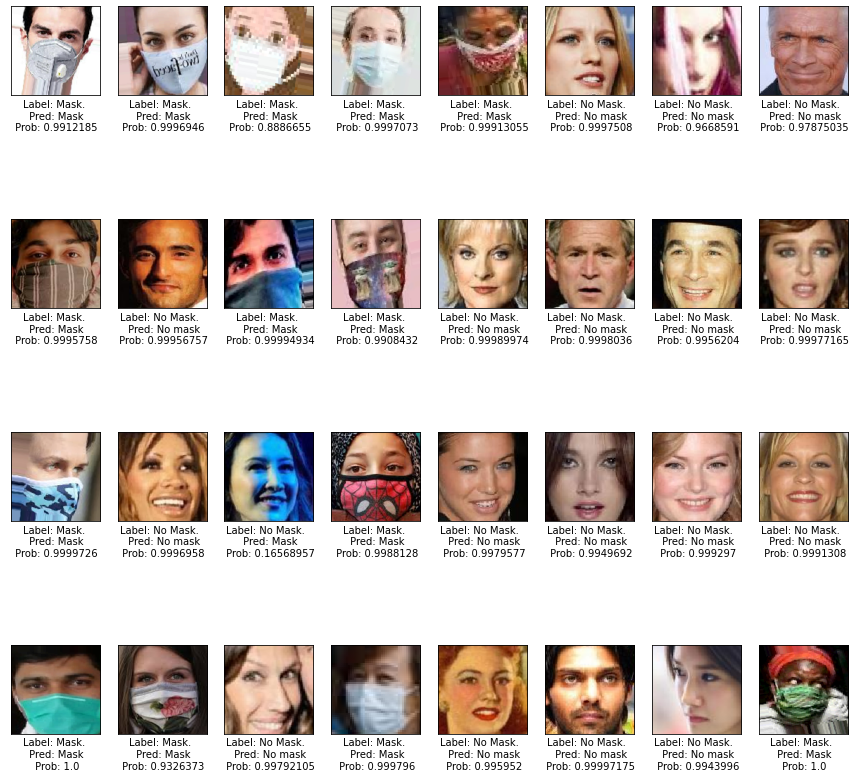

In [411]:
images, labels = next(iter(test_ds))
plt.figure(figsize=(15, 15))
acc = 0 
for i in range(32):


    img = images[i]
    img = np.expand_dims(img,axis=0)
    pred = np.argmax(model.predict(img),axis=-1)
   
    if pred == 0:
      pred = "Mask"
    else:
      pred = "No mask"
    plt.subplot(4, 8, i+1)
    plt.imshow(images[i])
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('Label: No Mask.  \n Pred: ' + pred + "\n Prob: " + str(model.predict(img)[0][1]) \
               if labels[i][1] else 'Label: Mask. \n Pred: ' + pred + "\n Prob: "  +  str(model.predict(img)[0][0]) )


In [26]:
class_names = ["mask","no_mask"]

# Test on New Images

In [188]:
import PIL
from PIL import Image

In [99]:
def load_and_prep_image(filename, img_shape=128, rescale=False):
  img = tf.io.read_file(filename)
  img = tf.io.decode_jpeg(filename, channels=3)
  # Resize the image
  img = tf.image.resize(img, [img_shape, img_shape])
  # Rescale the image (get all values between 0 and 1)
  if rescale:
      return img/255.
  else:
      return img/255.


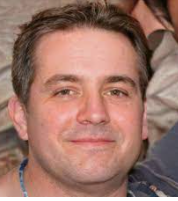

In [203]:
Image.open('/content/gdrive/MyDrive/DL_Project/kaggle_pics/kaggle_api/generic.PNG')

In [204]:
img = tf.io.read_file("/content/gdrive/MyDrive/DL_Project/kaggle_pics/kaggle_api/generic.PNG")

In [205]:
img = tf.io.decode_image(img, channels=3)

In [206]:
img = tf.image.resize(img, [128, 128])

In [207]:
img = img/255.

In [208]:
img.shape

TensorShape([128, 128, 3])

In [209]:
img = np.expand_dims(img,axis=0)
print(img.shape)

(1, 128, 128, 3)


In [210]:
pred = model.predict(img)

In [211]:
print(pred)

[[0.08299959 0.92913985]]


In [212]:
class_names[tf.argmax(pred[0])]

'no_mask'

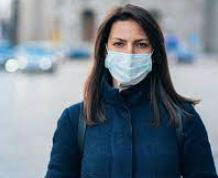

In [213]:
Image.open('/content/gdrive/MyDrive/DL_Project/kaggle_pics/test_mask.JPEG')

In [214]:
img2 = tf.io.read_file("/content/gdrive/MyDrive/DL_Project/kaggle_pics/test_mask.JPEG")

In [215]:
img2 = tf.io.decode_image(img2, channels=3)

In [216]:
img2 = tf.image.resize(img2, [128, 128])

In [217]:
img2 = img2/255.

In [218]:
img2 = np.expand_dims(img2,axis=0)
print(img2.shape)

(1, 128, 128, 3)


In [219]:
pred =  model.predict(img2)

In [220]:
print(pred)

[[9.996506e-01 3.802717e-04]]


In [221]:
class_names[tf.argmax(pred[0])]

'mask'

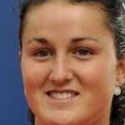

In [222]:
Image.open('/content/gdrive/MyDrive/DL_Project/kaggle_pics/kaggle_api/Face Mask Dataset/Test/WithoutMask/4144.png')

In [223]:
img3 =  tf.io.read_file("/content/gdrive/MyDrive/DL_Project/kaggle_pics/kaggle_api/Face Mask Dataset/Test/WithoutMask/4144.png")

In [224]:
img3 = tf.io.decode_image(img3, channels=3)

In [225]:
img3 = tf.image.resize(img3, [128, 128])

In [226]:
img3 = img3/255.

In [227]:
img3 = np.expand_dims(img3,axis=0)
print(img3.shape)

(1, 128, 128, 3)


In [228]:
pred =  model.predict(img3)

In [229]:
print(pred)

[[0.0033049 0.9965276]]


In [230]:
class_names[tf.argmax(pred[0])]

'no_mask'

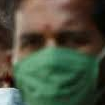

In [231]:
Image.open('/content/gdrive/MyDrive/DL_Project/kaggle_pics/kaggle_api/Face Mask Dataset/Test/WithMask/84.png')

In [232]:
img4 =  tf.io.read_file("/content/gdrive/MyDrive/DL_Project/kaggle_pics/kaggle_api/Face Mask Dataset/Test/WithMask/84.png")

In [233]:
img4 = tf.io.decode_image(img4, channels=3)

In [234]:
img4 = tf.image.resize(img4, [128, 128])

In [235]:
img4 = img4/255.

In [236]:
img4 = np.expand_dims(img4,axis=0)
print(img4.shape)

(1, 128, 128, 3)


In [237]:
pred =  model.predict(img4)

In [238]:
print(pred)

[[9.999949e-01 4.173266e-06]]


In [239]:
class_names[tf.argmax(pred[0])]

'mask'

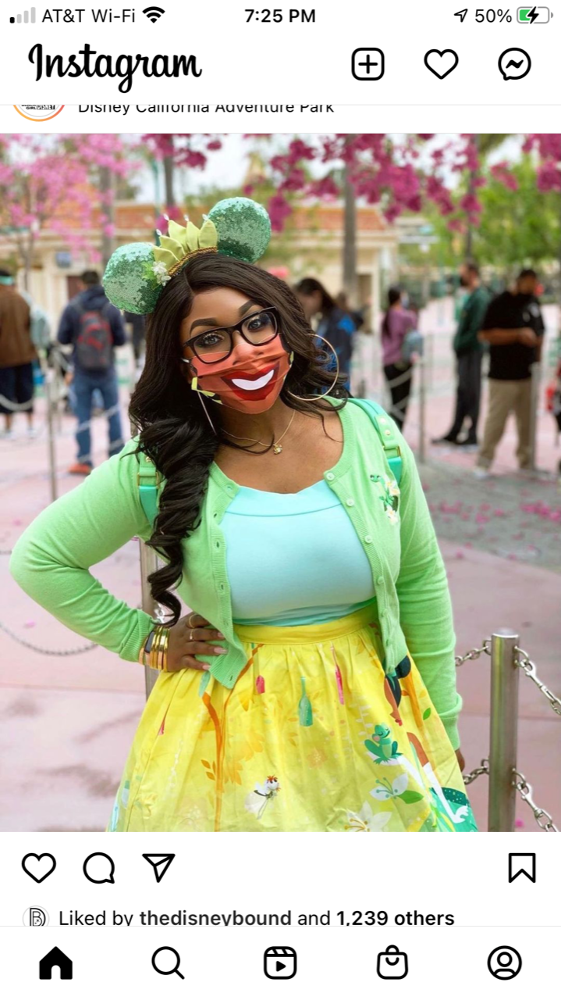

In [240]:
Image.open('/content/gdrive/MyDrive/DL_Project/kaggle_pics/email.png')

In [241]:
img5 =  tf.io.read_file("/content/gdrive/MyDrive/DL_Project/kaggle_pics/email.png")

In [242]:
img5 = tf.io.decode_image(img5, channels=3)

In [243]:
img5 = tf.image.resize(img5, [128, 128])

In [244]:
img5 = img5/255.

In [245]:
img5 = np.expand_dims(img5,axis=0)
print(img5.shape)

(1, 128, 128, 3)


In [246]:
pred =  model.predict(img5)

In [247]:
print(pred)

[[9.9960357e-01 1.7260564e-04]]


In [248]:
class_names[tf.argmax(pred[0])]

'mask'

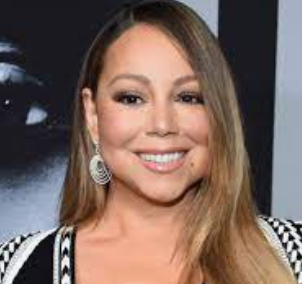

In [335]:
Image.open('/content/gdrive/MyDrive/DL_Project/kaggle_pics/mariah.PNG')

In [336]:
img6 =  tf.io.read_file("/content/gdrive/MyDrive/DL_Project/kaggle_pics/mariah.PNG")

In [337]:
img6 = tf.io.decode_image(img6, channels=3)

In [338]:
img6 = tf.image.resize(img6, [128, 128])

In [339]:
img6 = img6/255.

In [340]:
img6 = np.expand_dims(img6,axis=0)
print(img6.shape)

(1, 128, 128, 3)


In [341]:
pred =  model.predict(img6)

In [342]:
print(pred)

[[0.11194377 0.87134206]]


In [343]:
class_names[tf.argmax(pred[0])]

'no_mask'

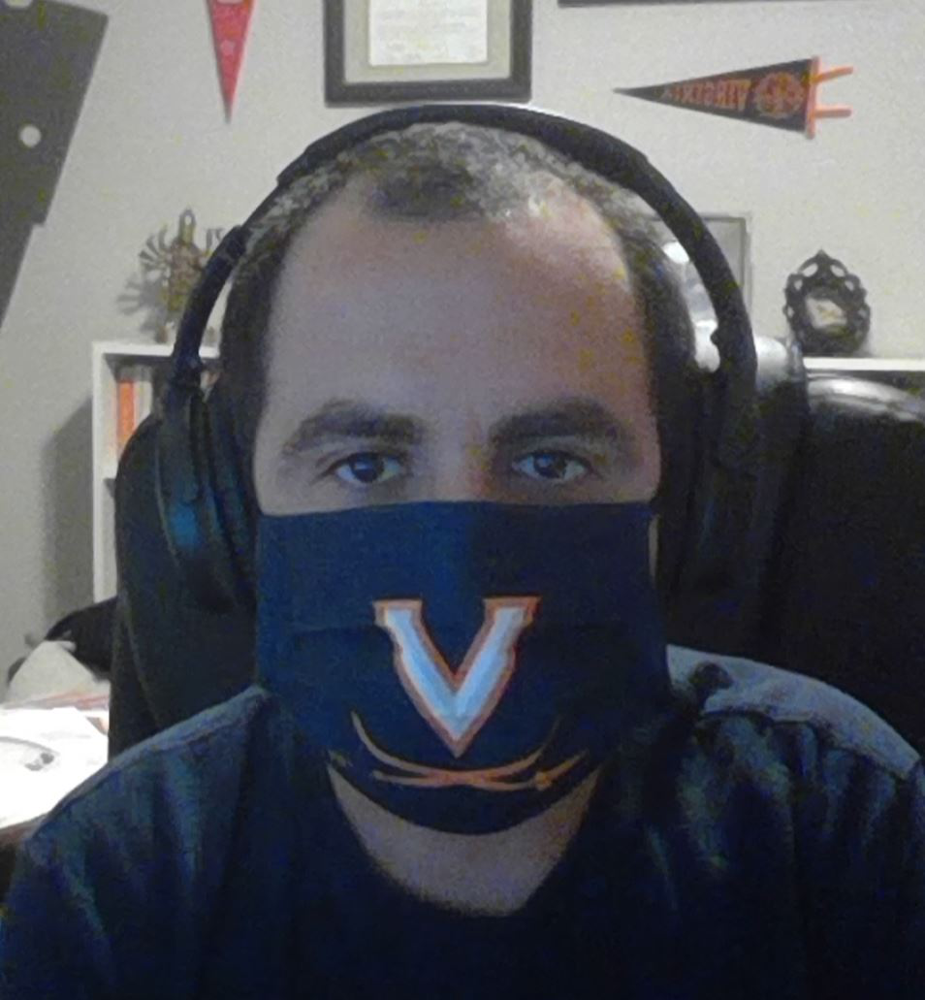

In [352]:
Image.open('/content/gdrive/MyDrive/DL_Project/kaggle_pics/me_test.JPG')

In [353]:
img8 =  tf.io.read_file("/content/gdrive/MyDrive/DL_Project/kaggle_pics/me_test.JPG")

In [354]:
img8 = tf.io.decode_image(img8, channels=3)
img8 = tf.image.resize(img8, [128, 128])
img8 = img8/255.
img8 = np.expand_dims(img8,axis=0)
print(img8.shape)

(1, 128, 128, 3)


In [355]:
pred =  model.predict(img8)
print(pred)

[[0.9992513  0.00139672]]


In [356]:
class_names[tf.argmax(pred[0])]

'mask'

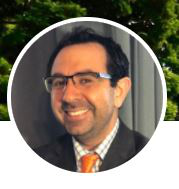

In [382]:
Image.open('/content/gdrive/MyDrive/DL_Project/kaggle_pics/linked.JPG')

In [383]:
img9 =  tf.io.read_file("/content/gdrive/MyDrive/DL_Project/kaggle_pics/linked.JPG")

In [384]:
img9 = tf.io.decode_image(img9, channels=3)
img9 = tf.image.resize(img9, [128, 128])
img9 = img9/255.
img9 = np.expand_dims(img9,axis=0)
print(img9.shape)

(1, 128, 128, 3)


In [385]:
pred =  model.predict(img9)
print(pred)

[[0.2564176 0.8035079]]


In [386]:
class_names[tf.argmax(pred[0])]

'no_mask'

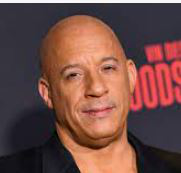

In [377]:
Image.open('/content/gdrive/MyDrive/DL_Project/kaggle_pics/vin.JPG')

In [378]:
img10 =  tf.io.read_file("/content/gdrive/MyDrive/DL_Project/kaggle_pics/vin.JPG")

In [379]:
img10 = tf.io.decode_image(img10, channels=3)
img10 = tf.image.resize(img10, [128, 128])
img10 = img10/255.
img10 = np.expand_dims(img10,axis=0)
print(img10.shape)

(1, 128, 128, 3)


In [380]:
pred =  model.predict(img10)
print(pred)

[[0.3536478  0.69056684]]


In [381]:
class_names[tf.argmax(pred[0])]

'no_mask'

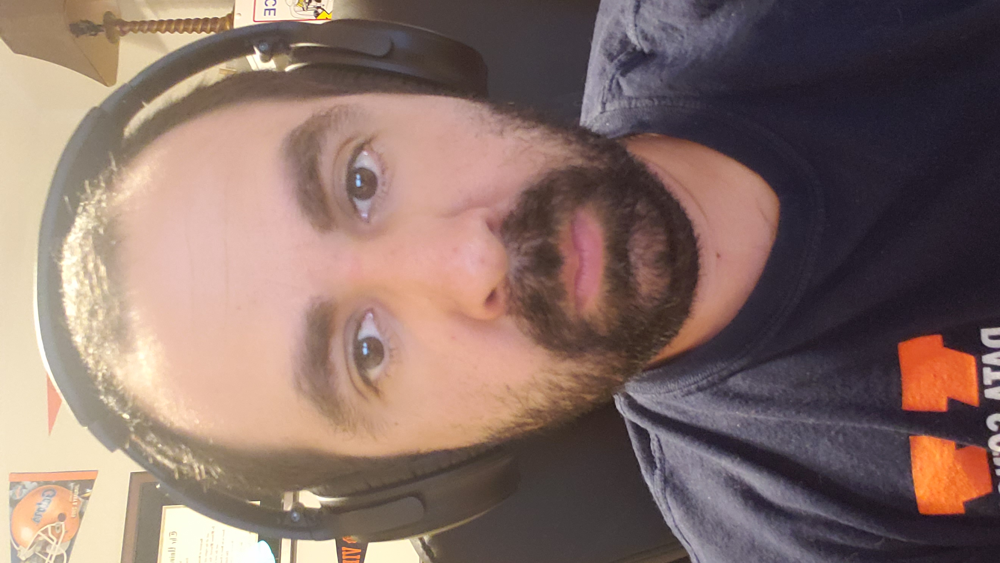

In [388]:
Image.open('/content/gdrive/MyDrive/DL_Project/kaggle_pics/me_test4.jpg')

In [389]:
img11 =  tf.io.read_file("/content/gdrive/MyDrive/DL_Project/kaggle_pics/me_test4.jpg")

In [390]:
img11 = tf.io.decode_image(img11, channels=3)
img11 = tf.image.resize(img11, [128, 128])
img11 = img11/255.
img11 = np.expand_dims(img11,axis=0)
print(img11.shape)

(1, 128, 128, 3)


In [395]:
pred =  model.predict(img11)
print(pred)


[[0.11020306 0.8786114 ]]


In [396]:

class_names[tf.argmax(pred[0])]

'no_mask'

# Get Model onto Cloud and Test

In [404]:
model_version = "0001"

In [405]:
model_name = "04292021_model"

In [406]:
model_path = os.path.join(model_name,model_version)
model_path

'04292021_model/0001'

In [407]:
output_dir = "/content/gdrive/MyDrive/DL_Project/"

In [408]:
model.save(output_dir + model_name + "_" + model_version)

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/DL_Project/04292021_model_0001/assets


In [412]:
saved_model = tf.saved_model.load("/content/gdrive/MyDrive/DL_Project/04292021_model_0001/")

In [451]:
y_pred = saved_model(tf.constant(img11))

In [452]:
y_pred

<tf.Tensor: shape=(1, 2), dtype=float32, numpy=array([[0.11020306, 0.8786114 ]], dtype=float32)>

In [409]:
print('Trained Model saved at {}'.format(output_dir))

Trained Model saved at /content/gdrive/MyDrive/DL_Project/


In [25]:
#model_trained = load_model(output_dir + 'trained_model.h5')

In [410]:
from google.colab import auth
auth.authenticate_user()

In [415]:
CLOUD_PROJECT = 'tjv9qh-codeathon-3-SYS6016'
BUCKET = 'gs://' + CLOUD_PROJECT + '-tjv9qh_codeathon_3-sys6016'

In [416]:
!curl https://sdk.cloud.google.com | bash
!gcloud init

Streaming output truncated to the last 5000 lines.
google-cloud-sdk/lib/surface/network_services/http_filters/delete.yaml
google-cloud-sdk/lib/surface/network_services/http_filters/export.yaml
google-cloud-sdk/lib/surface/network_services/http_filters/import.yaml
google-cloud-sdk/lib/surface/network_services/http_filters/list.yaml
google-cloud-sdk/lib/surface/notebooks/__init__.py
google-cloud-sdk/lib/surface/notebooks/environments/__init__.py
google-cloud-sdk/lib/surface/notebooks/environments/create.py
google-cloud-sdk/lib/surface/notebooks/environments/delete.py
google-cloud-sdk/lib/surface/notebooks/environments/describe.py
google-cloud-sdk/lib/surface/notebooks/environments/list.py
google-cloud-sdk/lib/surface/notebooks/instances/__init__.py
google-cloud-sdk/lib/surface/notebooks/instances/add_iam_policy_binding.yaml
google-cloud-sdk/lib/surface/notebooks/instances/create.py
google-cloud-sdk/lib/surface/notebooks/instances/delete.py
google-cloud-sdk/lib/surface/notebooks/instances

In [417]:
!gsutil cp -r /content/gdrive/MyDrive/DL_Project/04292021_model_0001 gs://tjv9qh_codeathon_3-sys6016

Copying file:///content/gdrive/MyDrive/DL_Project/04292021_model_0001/saved_model.pb [Content-Type=application/octet-stream]...
Copying file:///content/gdrive/MyDrive/DL_Project/04292021_model_0001/variables/variables.data-00000-of-00001 [Content-Type=application/octet-stream]...
Copying file:///content/gdrive/MyDrive/DL_Project/04292021_model_0001/variables/variables.index [Content-Type=application/octet-stream]...
\ [3 files][ 87.3 MiB/ 87.3 MiB]                                                
Operation completed over 3 objects/87.3 MiB.                                     


In [424]:
import os

In [466]:
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "tjv9qh-codeathon-3-381435a8c0d0.json" 

In [460]:
import googleapiclient.discovery

In [481]:
project_id = "tjv9qh-codeathon-3"
model_id = "tjv9qh_codeathon_3_sys6016"
model_path = "projects/{}/models/{}".format(project_id,model_id)
ml_resource = googleapiclient.discovery.build("ml","v1").projects()

In [482]:
def predict(X):
  input_data_json = {"signature_name": "serving_default",
                     "instances": X.tolist()}
  request = ml_resource.predict(name = model_path, body = input_data_json)
  response = request.execute()
  if "error" in response:
    raise RuntimeError(response["error"])
  return np.array([pred[output_name] for pred in response["predictions"]])

In [479]:
y_pred = model.predict(img11)
y_pred

array([[0.11020306, 0.8786114 ]], dtype=float32)